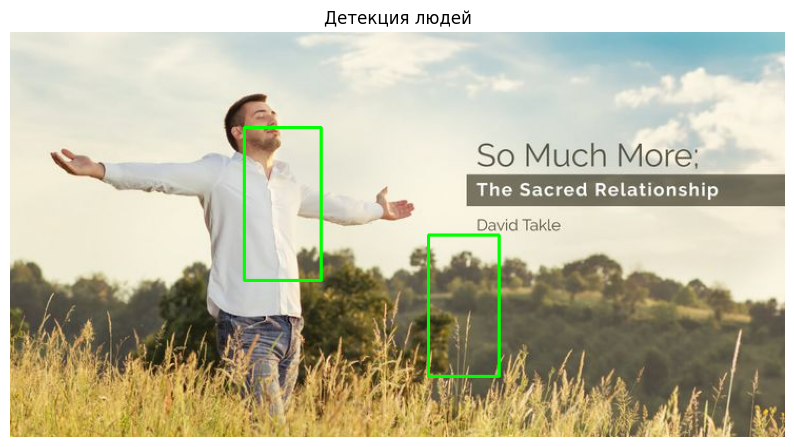

In [13]:
import cv2
import matplotlib.pyplot as plt

# Загружаем изображение
image = cv2.imread("1.jpg")  # замените на путь к вашей картинке
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Инициализация HOG + предобученный SVM для людей
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# Детекция людей
boxes, weights = hog.detectMultiScale(image,
                                      winStride=(8, 8),
                                      padding=(8, 8),
                                      scale=1.05)

# Отрисовка прямоугольников
for (x, y, w, h) in boxes:
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Вывод результата в ноутбуке
plt.figure(figsize=(10, 8))
plt.imshow(image)
plt.axis("off")
plt.title("Детекция людей")
plt.show()


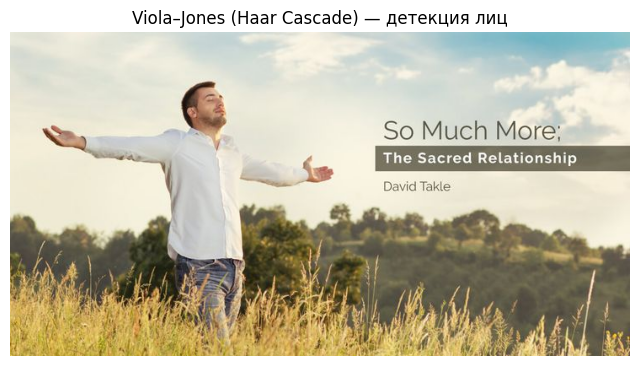

In [37]:
import cv2
import matplotlib.pyplot as plt

# Загружаем классификатор для лиц
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_frontalface_default.xml")

# Загружаем изображение
img = cv2.imread("1.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Детекция лиц
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)

# Рисуем рамки
for (x, y, w, h) in faces:
    cv2.rectangle(img, (x, y), (x+w, y+h), (255, 0, 0), 2)

# Отображаем в Jupyter
plt.figure(figsize=(8,6))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Viola–Jones (Haar Cascade) — детекция лиц")
plt.show()


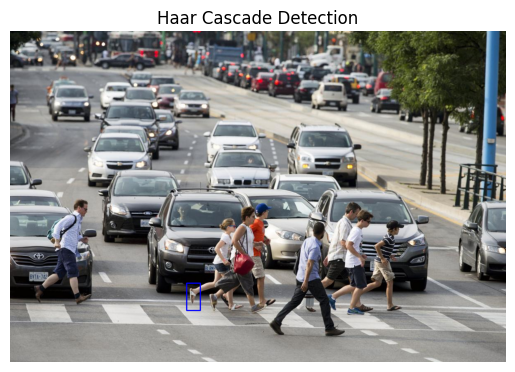

In [11]:
import cv2
import matplotlib.pyplot as plt

# Загружаем изображение
image = cv2.imread("pedestrians.jpg")
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Загружаем предобученный классификатор для людей (fullbody)
haar_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_fullbody.xml")

# Детекция
bodies = haar_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=3)

# Отрисовка
for (x, y, w, h) in bodies:
    cv2.rectangle(image, (x, y), (x+w, y+h), (255, 0, 0), 2)

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Haar Cascade Detection")
plt.show()


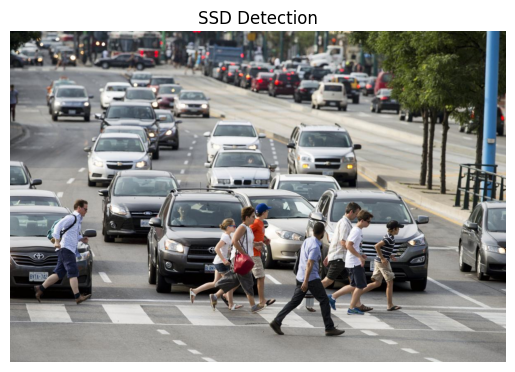

In [10]:
import cv2
import matplotlib.pyplot as plt

# Загружаем модель SSD + MobileNet
net = cv2.dnn.readNetFromCaffe("deploy.prototxt", "res10_300x300_ssd_iter_140000.caffemodel")

image = cv2.imread("pedestrians.jpg")
(h, w) = image.shape[:2]

# Подготовка входа
blob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 1.0,
                             (300, 300), (104.0, 177.0, 123.0))
net.setInput(blob)
detections = net.forward()

# Отрисовка
for i in range(detections.shape[2]):
    confidence = detections[0, 0, i, 2]
    if confidence > 0.5:
        box = detections[0, 0, i, 3:7] * [w, h, w, h]
        (x1, y1, x2, y2) = box.astype("int")
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("SSD Detection")
plt.show()



image 1/1 c:\Users\DELL\Desktop\tms\tms_study\lesson_18\pedestrians.jpg: 448x640 11 persons, 25 cars, 1 handbag, 73.9ms
Speed: 3.3ms preprocess, 73.9ms inference, 27.5ms postprocess per image at shape (1, 3, 448, 640)


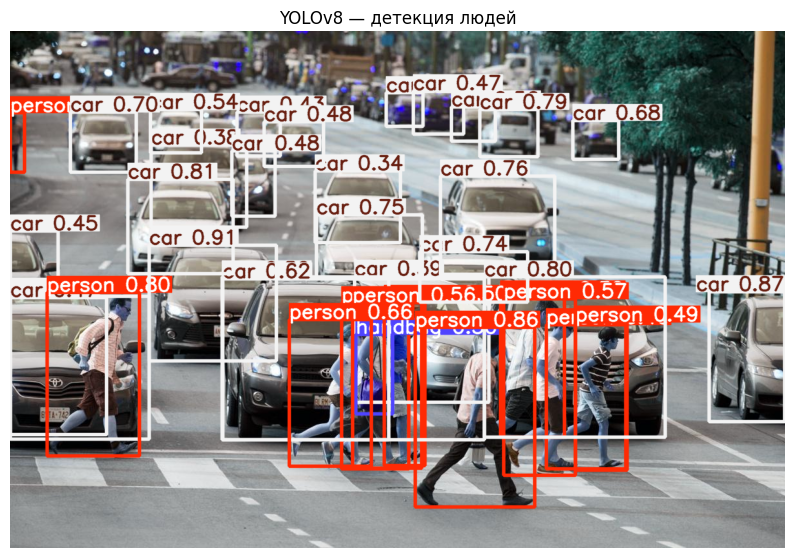

In [9]:
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Загружаем предобученную модель (маленькая и быстрая версия)
model = YOLO("yolov8n.pt")

# Запускаем детекцию на изображении
results = model("pedestrians.jpg")  # замените на путь к вашей картинке

# Отобразим результат прямо в ноутбуке
res_img = results[0].plot()  # картинка с нарисованными боксами
plt.figure(figsize=(10, 8))
plt.imshow(res_img)
plt.axis("off")
plt.title("YOLOv8 — детекция людей")
plt.show()


In [ ]:
import cv2
from ultralytics import YOLO
from IPython.display import display, clear_output
import matplotlib.pyplot as plt

# Загружаем модель YOLOv8 (nano-версия для скорости)
model = YOLO("yolov8n.pt")

# Открываем веб-камеру
cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("❌ Камера не открылась")
else:
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                break

            # Детекция объектов
            results = model(frame, verbose=False)

            # Получаем кадр с нарисованными боксами
            annotated_frame = results[0].plot()

            # Конвертируем BGR → RGB для matplotlib
            annotated_frame = cv2.cvtColor(annotated_frame, cv2.COLOR_BGR2RGB)

            # Выводим в Jupyter
            plt.imshow(annotated_frame)
            plt.axis("off")
            clear_output(wait=True)
            display(plt.gcf())
            plt.clf()

    except KeyboardInterrupt:
        print("⏹ Остановлено пользователем (Ctrl+C)")

    cap.release()


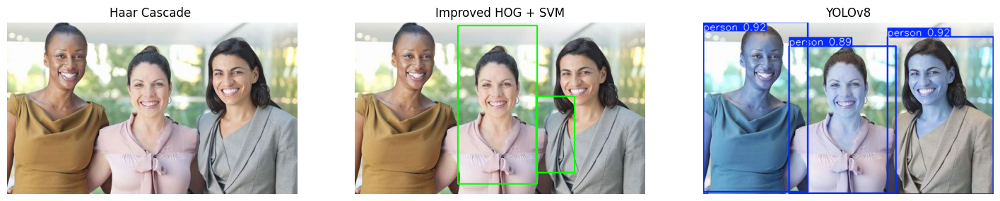

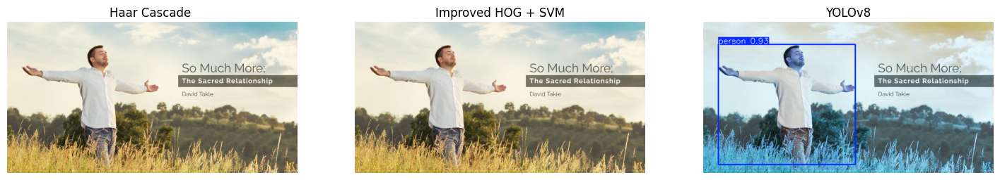

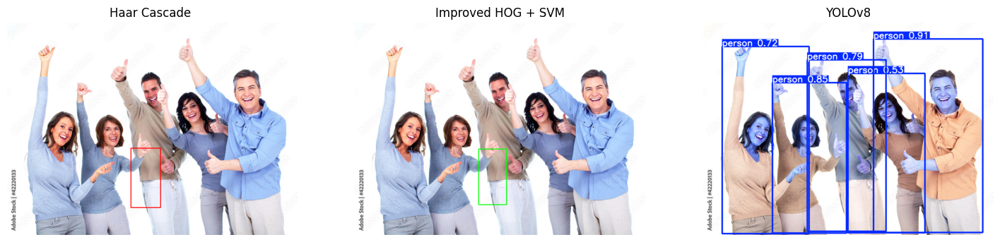

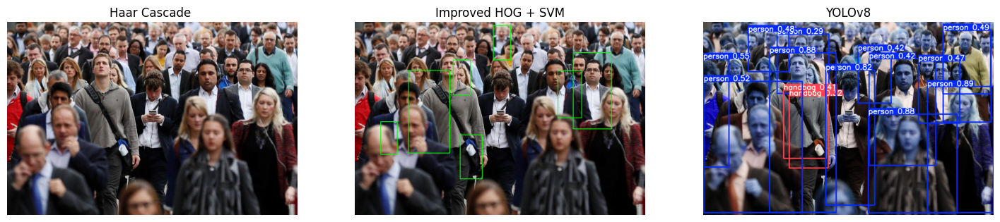

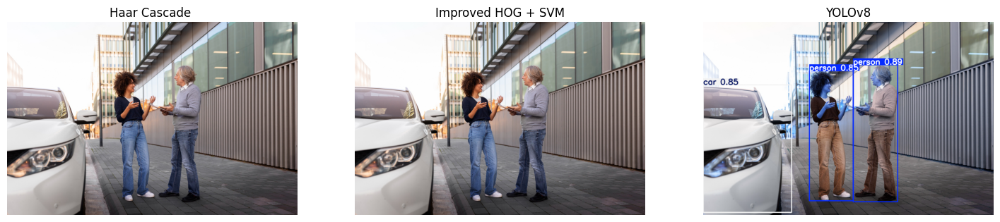

...

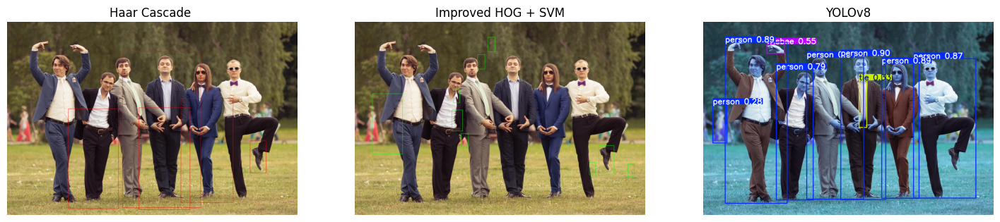

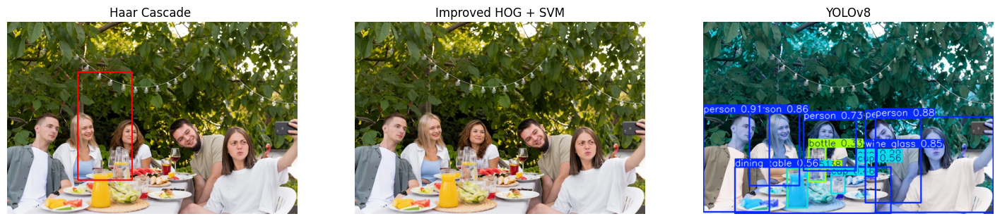

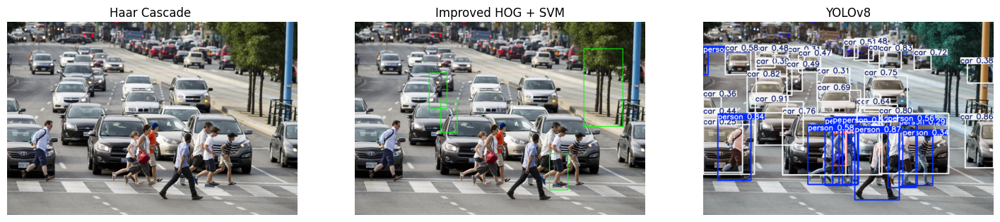

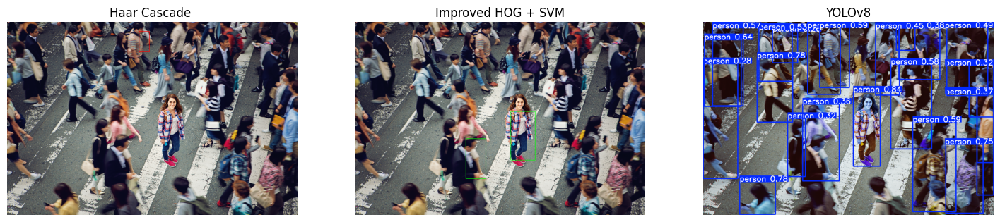

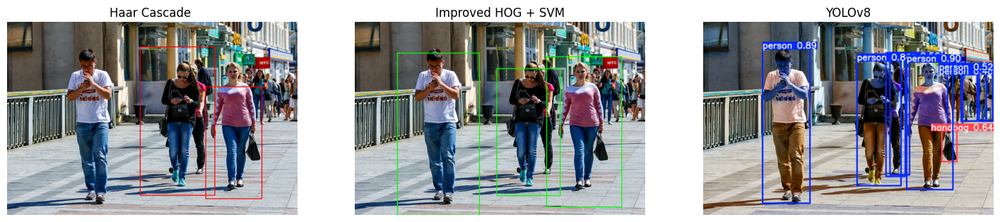

In [42]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from ultralytics import YOLO

# --- Укажи путь к папке с изображениями ---
folder_path = r"./photo"  # <-- поменяй на свой путь

# --- Загружаем модели один раз ---
haar = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_fullbody.xml")

hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

yolo = YOLO("yolov8n.pt")

# --- Функция NMS ---
def non_max_suppression(boxes, overlapThresh=0.4):
    if len(boxes) == 0:
        return []
    boxes = np.array(boxes)
    x1, y1, x2, y2 = boxes[:,0], boxes[:,1], boxes[:,2], boxes[:,3]
    areas = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(y2)
    pick = []
    while len(idxs) > 0:
        last = idxs[-1]
        pick.append(last)
        xx1 = np.maximum(x1[last], x1[idxs[:-1]])
        yy1 = np.maximum(y1[last], y1[idxs[:-1]])
        xx2 = np.minimum(x2[last], x2[idxs[:-1]])
        yy2 = np.minimum(y2[last], y2[idxs[:-1]])
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
        overlap = (w * h) / areas[idxs[:-1]]
        idxs = np.delete(idxs, np.concatenate(([len(idxs)-1],
                                               np.where(overlap > overlapThresh)[0])))
    return boxes[pick].astype("int")

# --- Перебор всех файлов в папке ---
for filename in os.listdir(folder_path):
    if filename.lower().endswith((".jpg", ".jpeg", ".png")):
        img_path = os.path.join(folder_path, filename)
        image = cv2.imread(img_path)
        if image is None:
            continue
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # --- 1. Haar Cascade ---
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        haar_img = image_rgb.copy()
        bodies = haar.detectMultiScale(gray, scaleFactor=1.05, minNeighbors=5, minSize=(60,120))
        for (x,y,w,h) in bodies:
            cv2.rectangle(haar_img, (x,y), (x+w,y+h), (255,0,0), 2)

        # --- 2. Улучшенный HOG + SVM ---
        # Предобработка: CLAHE + сглаживание
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        gray = clahe.apply(gray)
        gray = cv2.GaussianBlur(gray, (3,3), 0)

        hog_img = image_rgb.copy()
        boxes, weights = hog.detectMultiScale(gray, winStride=(4,4), padding=(8,8), scale=1.03)
        filtered_boxes = []
        for (x,y,w,h), weight in zip(boxes, weights):
            if weight > 0.6:
                filtered_boxes.append([x,y,x+w,y+h])
        nms_boxes = non_max_suppression(filtered_boxes)
        for (x1,y1,x2,y2) in nms_boxes:
            cv2.rectangle(hog_img, (x1,y1), (x2,y2), (0,255,0), 2)

        # --- 3. YOLOv8 ---
        results = yolo(image_rgb, verbose=False)
        yolo_img = results[0].plot()
        yolo_img = cv2.cvtColor(yolo_img, cv2.COLOR_BGR2RGB)

        # --- Визуализация ---
        fig, axs = plt.subplots(1, 3, figsize=(18, 8))
        axs[0].imshow(haar_img); axs[0].set_title(f"Haar Cascade ");axs[0].axis("off")
        axs[1].imshow(hog_img); axs[1].set_title("Improved HOG + SVM"); axs[1].axis("off")
        axs[2].imshow(yolo_img); axs[2].set_title("YOLOv8"); axs[2].axis("off")
        plt.show()


[INFO] Загружено 9715 примеров (9714 pos / 1 neg), размер признаков: 3780
[INFO] Точность на обучении: 1.000


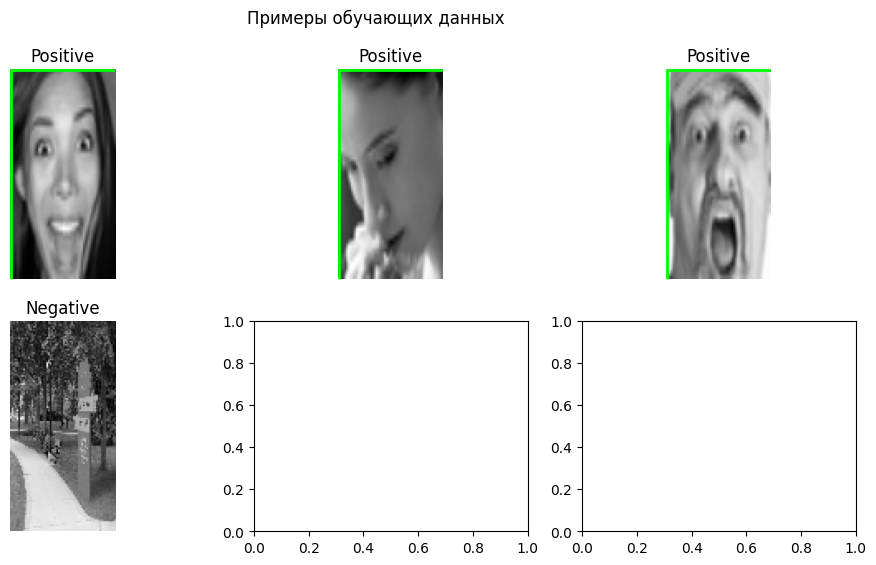

[INFO] Всего окон проверено: 7125
[INFO] Найдено кандидатов: 7054


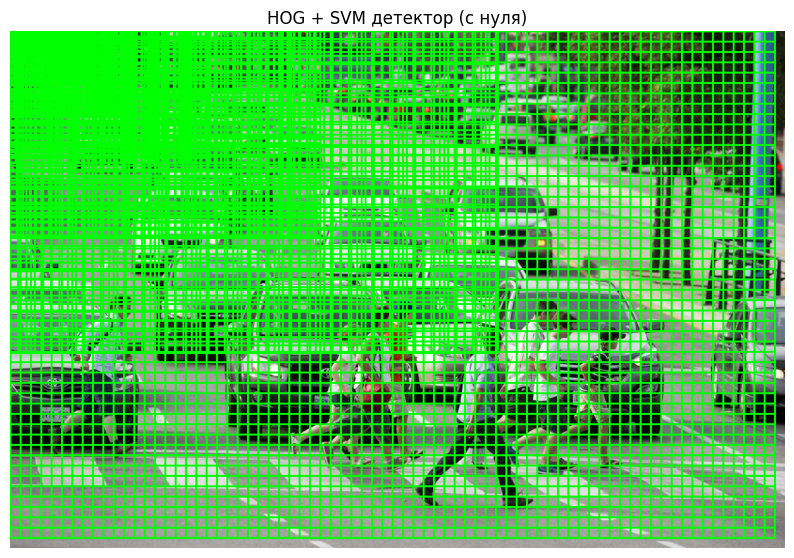

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.metrics import accuracy_score
import glob, os

# --- 1. Функция для вычисления HOG признаков ---
def compute_hog(img, cell_size=8, block_size=2, nbins=9):
    gx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=1)
    gy = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=1)
    mag, ang = cv2.cartToPolar(gx, gy, angleInDegrees=True)

    h, w = img.shape
    n_cells_x = w // cell_size
    n_cells_y = h // cell_size
    bin_width = 180 / nbins

    hog_cells = np.zeros((n_cells_y, n_cells_x, nbins), dtype=np.float32)
    for i in range(n_cells_y):
        for j in range(n_cells_x):
            cell_mag = mag[i*cell_size:(i+1)*cell_size, j*cell_size:(j+1)*cell_size]
            cell_ang = ang[i*cell_size:(i+1)*cell_size, j*cell_size:(j+1)*cell_size]
            hist = np.zeros(nbins, dtype=np.float32)
            for y in range(cell_size):
                for x in range(cell_size):
                    angle = cell_ang[y, x] % 180
                    m = cell_mag[y, x]
                    bin_idx = int(angle // bin_width)
                    next_bin = (bin_idx + 1) % nbins
                    ratio = (angle - bin_idx*bin_width) / bin_width
                    hist[bin_idx] += m * (1 - ratio)
                    hist[next_bin] += m * ratio
            hog_cells[i, j] = hist

    eps = 1e-6
    hog_vector = []
    for i in range(n_cells_y - block_size + 1):
        for j in range(n_cells_x - block_size + 1):
            block = hog_cells[i:i+block_size, j:j+block_size].ravel()
            norm = np.linalg.norm(block) + eps
            block = block / norm
            block = np.clip(block, 0, 0.2)
            block = block / (np.linalg.norm(block) + eps)
            hog_vector.extend(block)
    return np.array(hog_vector)

# --- 2. Подготовка данных ---
pos_dir = "photo/pos"
neg_dir = "photo/neg"

X, y = [], []
for f in glob.glob(os.path.join(pos_dir, "*.png")):
    img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (64,128))
    X.append(compute_hog(img))
    y.append(1)

for f in glob.glob(os.path.join(neg_dir, "*.png")):
    img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
    img = cv2.resize(img, (64,128))
    X.append(compute_hog(img))
    y.append(0)

X, y = np.array(X), np.array(y)
print(f"[INFO] Загружено {len(X)} примеров ({sum(y)} pos / {len(y)-sum(y)} neg), размер признаков: {X.shape[1]}")

# --- 3. Обучение SVM ---
clf = svm.LinearSVC(max_iter=5000)
clf.fit(X, y)
print(f"[INFO] Точность на обучении: {accuracy_score(y, clf.predict(X)):.3f}")

# --- 4. Визуализация обучающих примеров ---
def visualize_training_examples(pos_dir, neg_dir, n=3):
    pos_files = glob.glob(os.path.join(pos_dir, "*.png"))[:n]
    neg_files = glob.glob(os.path.join(neg_dir, "*.png"))[:n]
    fig, axs = plt.subplots(2, n, figsize=(12,6))
    for i, f in enumerate(pos_files):
        img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (64,128))
        axs[0,i].imshow(img, cmap="gray")
        axs[0,i].set_title("Positive")
        axs[0,i].axis("off")
        axs[0,i].add_patch(plt.Rectangle((0,0),64,128,fill=False,color="lime",lw=2))
    for i, f in enumerate(neg_files):
        img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (64,128))
        axs[1,i].imshow(img, cmap="gray")
        axs[1,i].set_title("Negative")
        axs[1,i].axis("off")
    plt.suptitle("Примеры обучающих данных")
    plt.show()

visualize_training_examples(pos_dir, neg_dir)

# --- 5. Детекция ---
def detect_people(img, clf, win_size=(64,128), step=16, scale=1.25):
    detections = []
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape
    scale_factor = 1.0
    total_windows = 0
    while h >= win_size[1] and w >= win_size[0]:
        for y in range(0, h - win_size[1], step):
            for x in range(0, w - win_size[0], step):
                window = gray[y:y+win_size[1], x:x+win_size[0]]
                feat = compute_hog(cv2.resize(window, win_size))
                pred = clf.predict([feat])[0]
                total_windows += 1
                if pred == 1:
                    detections.append((int(x/scale_factor), int(y/scale_factor),
                                       int(win_size[0]/scale_factor), int(win_size[1]/scale_factor)))
        gray = cv2.resize(gray, (int(w/scale), int(h/scale)))
        h, w = gray.shape
        scale_factor *= scale
    print(f"[INFO] Всего окон проверено: {total_windows}")
    print(f"[INFO] Найдено кандидатов: {len(detections)}")
    return detections

test_img = cv2.imread("./photo/pedestrians.jpg")
detections = detect_people(test_img, clf)

for (x,y,w,h) in detections:
    cv2.rectangle(test_img, (x,y), (x+w,y+h), (0,255,0), 2)

plt.figure(figsize=(10,8))
plt.imshow(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("HOG + SVM детектор (с нуля)")
plt.show()


[INFO] Загружено 9722 примеров (9714 pos / 8 neg), размер признаков: 3780
[INFO] Точность на обучении: 1.000


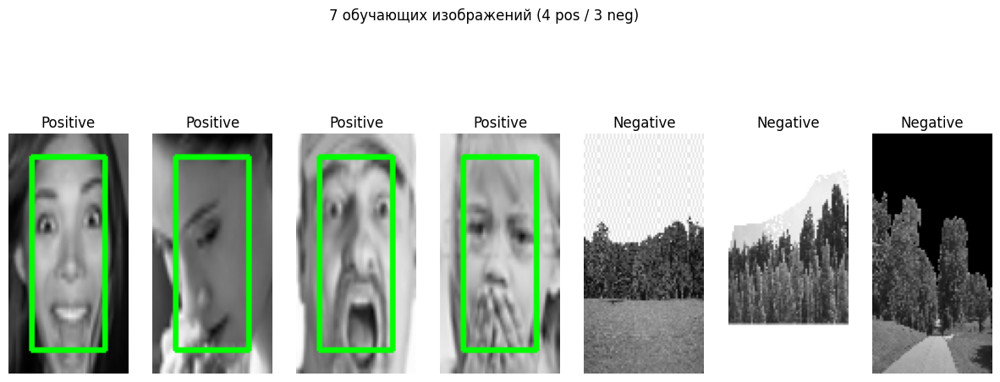

[INFO] Всего окон проверено: 7125
[INFO] Найдено кандидатов (до NMS): 2913
[INFO] После NMS осталось: 217


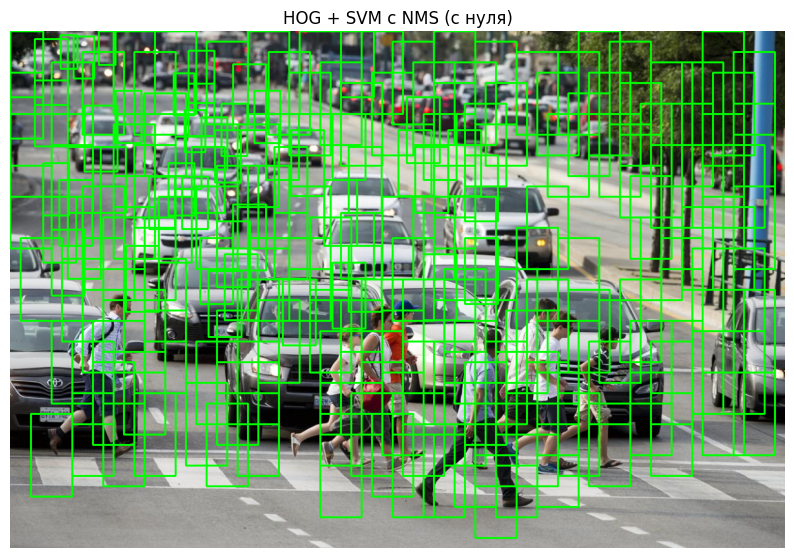

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn import svm
from sklearn.metrics import accuracy_score
import glob, os

# --- 1. Функция для вычисления HOG признаков ---
def compute_hog(img, cell_size=8, block_size=2, nbins=9):
    gx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=1)
    gy = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=1)
    mag, ang = cv2.cartToPolar(gx, gy, angleInDegrees=True)

    h, w = img.shape
    n_cells_x = w // cell_size
    n_cells_y = h // cell_size
    bin_width = 180 / nbins

    hog_cells = np.zeros((n_cells_y, n_cells_x, nbins), dtype=np.float32)
    for i in range(n_cells_y):
        for j in range(n_cells_x):
            cell_mag = mag[i*cell_size:(i+1)*cell_size, j*cell_size:(j+1)*cell_size]
            cell_ang = ang[i*cell_size:(i+1)*cell_size, j*cell_size:(j+1)*cell_size]
            hist = np.zeros(nbins, dtype=np.float32)
            for y in range(cell_size):
                for x in range(cell_size):
                    angle = cell_ang[y, x] % 180
                    m = cell_mag[y, x]
                    bin_idx = int(angle // bin_width)
                    next_bin = (bin_idx + 1) % nbins
                    ratio = (angle - bin_idx*bin_width) / bin_width
                    hist[bin_idx] += m * (1 - ratio)
                    hist[next_bin] += m * ratio
            hog_cells[i, j] = hist

    eps = 1e-6
    hog_vector = []
    for i in range(n_cells_y - block_size + 1):
        for j in range(n_cells_x - block_size + 1):
            block = hog_cells[i:i+block_size, j:j+block_size].ravel()
            norm = np.linalg.norm(block) + eps
            block = block / norm
            block = np.clip(block, 0, 0.2)
            block = block / (np.linalg.norm(block) + eps)
            hog_vector.extend(block)
    return np.array(hog_vector)

# --- 2. Подготовка данных ---
pos_dir = "photo/pos"
neg_dir = "photo/neg"

X, y = [], []
for f in glob.glob(os.path.join(pos_dir, "*.png")):
    img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
    if img is None: continue
    img = cv2.resize(img, (64,128))
    X.append(compute_hog(img))
    y.append(1)

for f in glob.glob(os.path.join(neg_dir, "*.png")):
    img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
    if img is None: continue
    img = cv2.resize(img, (64,128))
    X.append(compute_hog(img))
    y.append(0)

X, y = np.array(X), np.array(y)
print(f"[INFO] Загружено {len(X)} примеров ({sum(y)} pos / {len(y)-sum(y)} neg), размер признаков: {X.shape[1]}")

# --- 3. Обучение SVM ---
clf = svm.LinearSVC(max_iter=5000)
clf.fit(X, y)
print(f"[INFO] Точность на обучении: {accuracy_score(y, clf.predict(X)):.3f}")

# --- 4. Визуализация обучающих примеров (4 pos + 3 neg) ---
def visualize_training_examples(pos_dir, neg_dir, n_pos=4, n_neg=3):
    pos_files = glob.glob(os.path.join(pos_dir, "*.png"))[:n_pos]
    neg_files = glob.glob(os.path.join(neg_dir, "*.png"))[:n_neg]
    files = pos_files + neg_files
    labels = ["Positive"]*len(pos_files) + ["Negative"]*len(neg_files)

    plt.figure(figsize=(15,6))
    for i, (f, label) in enumerate(zip(files, labels)):
        img = cv2.imread(f, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (64,128))
        img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        if label == "Positive":
            # рамка по центру (имитация человека)
            h, w = img.shape
            x1, y1 = int(w*0.2), int(h*0.1)
            x2, y2 = int(w*0.8), int(h*0.9)
            cv2.rectangle(img_color, (x1,y1), (x2,y2), (0,255,0), 2)
        plt.subplot(1,7,i+1)
        plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))
        plt.title(label)
        plt.axis("off")
    plt.suptitle("7 обучающих изображений (4 pos / 3 neg)")
    plt.show()

visualize_training_examples(pos_dir, neg_dir)

# --- 5. Non-Max Suppression ---
def non_max_suppression(boxes, overlapThresh=0.4):
    if len(boxes) == 0:
        return []
    boxes = np.array(boxes)
    x1 = boxes[:,0]
    y1 = boxes[:,1]
    x2 = boxes[:,0] + boxes[:,2]
    y2 = boxes[:,1] + boxes[:,3]
    areas = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(y2)
    pick = []
    while len(idxs) > 0:
        last = idxs[-1]
        pick.append(last)
        xx1 = np.maximum(x1[last], x1[idxs[:-1]])
        yy1 = np.maximum(y1[last], y1[idxs[:-1]])
        xx2 = np.minimum(x2[last], x2[idxs[:-1]])
        yy2 = np.minimum(y2[last], y2[idxs[:-1]])
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
        overlap = (w * h) / areas[idxs[:-1]]
        idxs = np.delete(idxs, np.concatenate(([len(idxs)-1],
                                               np.where(overlap > overlapThresh)[0])))
    return boxes[pick].astype("int")

# --- 6. Детекция с NMS ---
def detect_people(img, clf, win_size=(64,128), step=16, scale=1.25, nms_thresh=0.4):
    detections = []
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape
    scale_factor = 1.0
    total_windows = 0
    while h >= win_size[1] and w >= win_size[0]:
        for y in range(0, h - win_size[1], step):
            for x in range(0, w - win_size[0], step):
                window = gray[y:y+win_size[1], x:x+win_size[0]]
                feat = compute_hog(cv2.resize(window, win_size))
                pred = clf.predict([feat])[0]
                total_windows += 1
                if pred == 1:
                    detections.append((int(x/scale_factor), int(y/scale_factor),
                                       int(win_size[0]/scale_factor), int(win_size[1]/scale_factor)))
        gray = cv2.resize(gray, (int(w/scale), int(h/scale)))
        h, w = gray.shape
        scale_factor *= scale
    print(f"[INFO] Всего окон проверено: {total_windows}")
    print(f"[INFO] Найдено кандидатов (до NMS): {len(detections)}")
    final_boxes = non_max_suppression(detections, overlapThresh=nms_thresh)
    print(f"[INFO] После NMS осталось: {len(final_boxes)}")
    return final_boxes

# --- 7. Применение ---
test_img = cv2.imread("./photo/pedestrians.jpg")
final_boxes = detect_people(test_img, clf)

for (x,y,w,h) in final_boxes:
    cv2.rectangle(test_img, (x,y), (x+w,y+h), (0,255,0), 2)

plt.figure(figsize=(10,8))
plt.imshow(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("HOG + SVM с NMS (с нуля)")
plt.show()


[INFO] Всего окон проверено: 913
[INFO] Найдено кандидатов (до NMS): 863
[INFO] После NMS осталось: 46


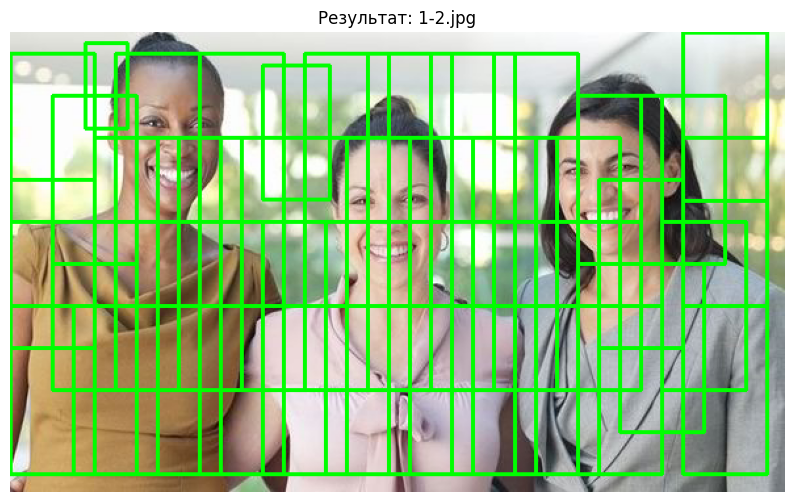

[INFO] Всего окон проверено: 1448
[INFO] Найдено кандидатов (до NMS): 794
[INFO] После NMS осталось: 67


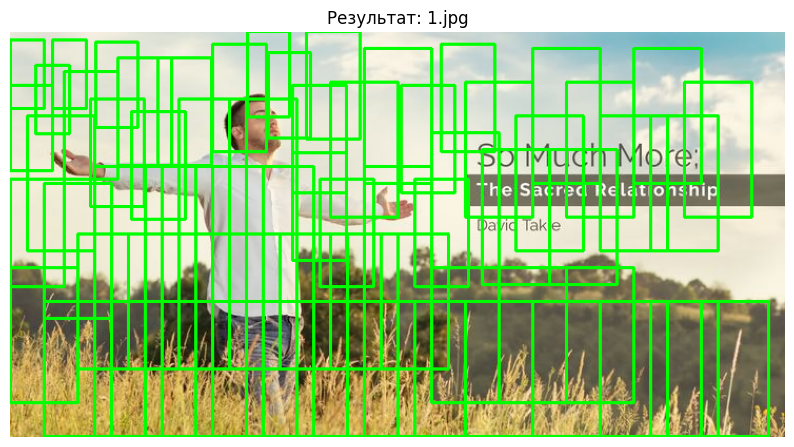

[INFO] Всего окон проверено: 7125
[INFO] Найдено кандидатов (до NMS): 6923
[INFO] После NMS осталось: 293


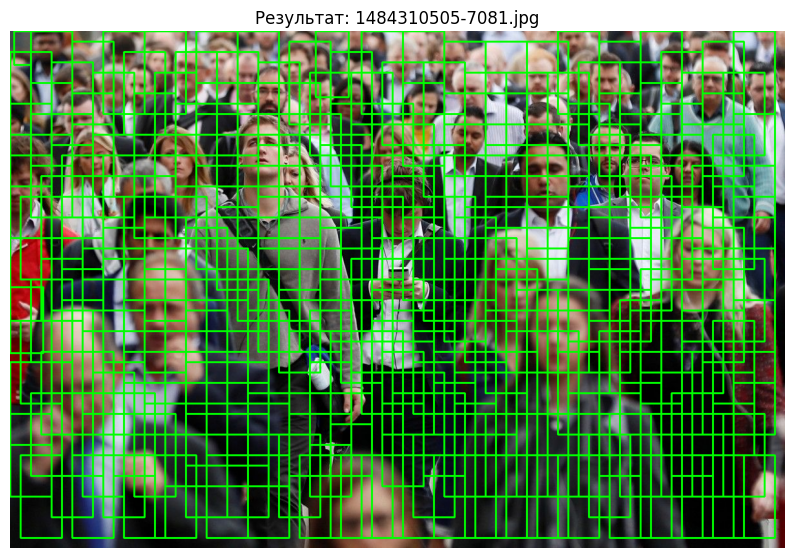

[INFO] Всего окон проверено: 5247
[INFO] Найдено кандидатов (до NMS): 4371
[INFO] После NMS осталось: 209


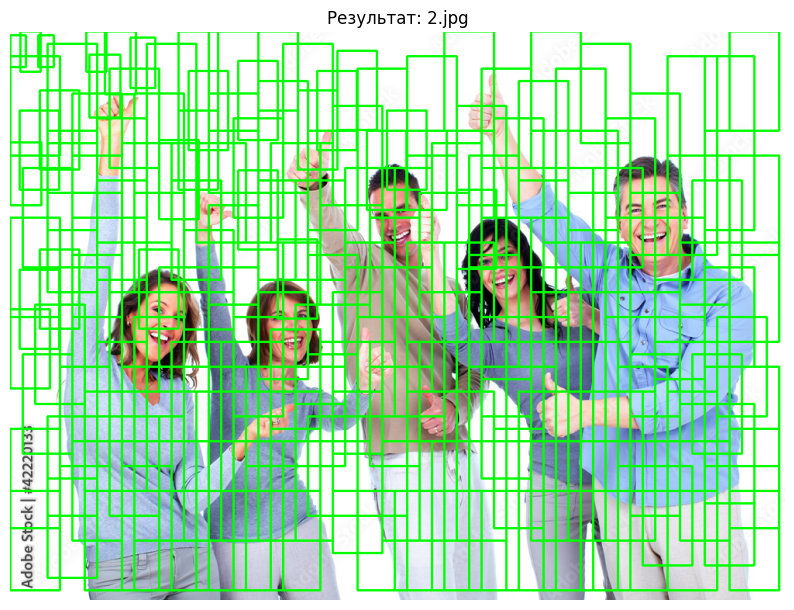

[INFO] Всего окон проверено: 12075
[INFO] Найдено кандидатов (до NMS): 8912
[INFO] После NMS осталось: 430


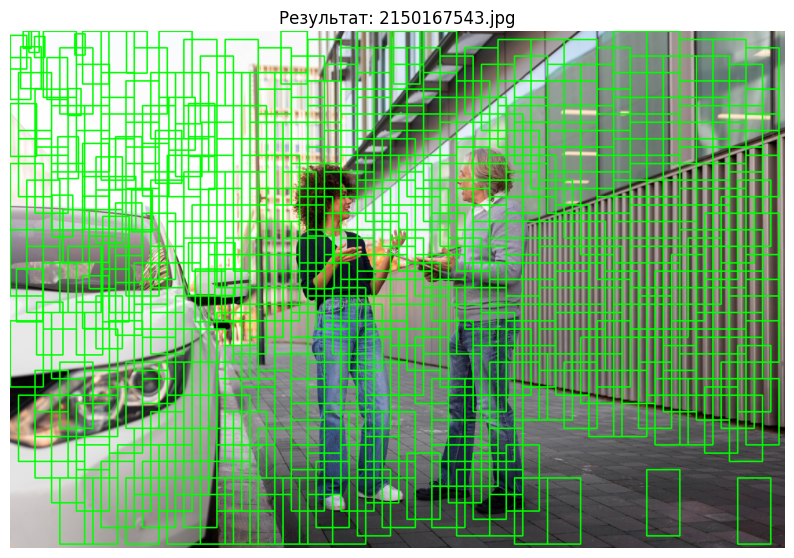

[INFO] Всего окон проверено: 96870
[INFO] Найдено кандидатов (до NMS): 89761
[INFO] После NMS осталось: 3468


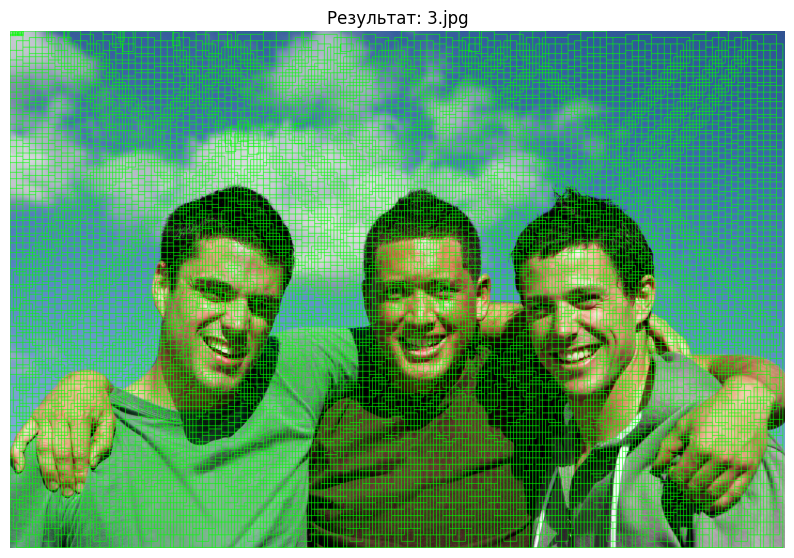

[INFO] Всего окон проверено: 757
[INFO] Найдено кандидатов (до NMS): 713
[INFO] После NMS осталось: 42


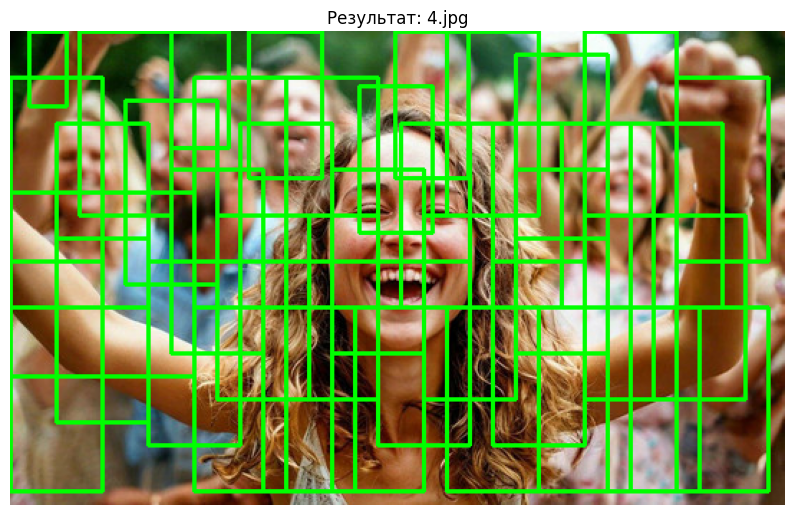

[INFO] Всего окон проверено: 6292
[INFO] Найдено кандидатов (до NMS): 4968
[INFO] После NMS осталось: 231


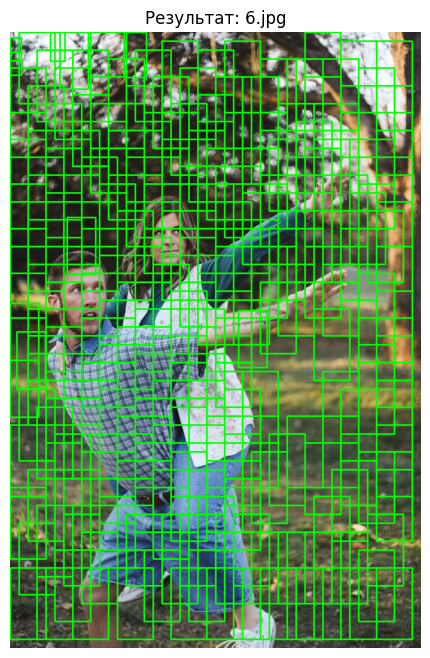

KeyboardInterrupt: 

In [12]:
import glob

# Папка с тестовыми изображениями
test_dir = "./photo"   # например, ./photo/test/*.jpg

for f in glob.glob(os.path.join(test_dir, "*.jpg")):
    test_img = cv2.imread(f)
    if test_img is None:
        continue

    final_boxes = detect_people(test_img, clf)

    for (x,y,w,h) in final_boxes:
        cv2.rectangle(test_img, (x,y), (x+w,y+h), (0,255,0), 2)

    plt.figure(figsize=(10,8))
    plt.imshow(cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title(f"Результат: {os.path.basename(f)}")
    plt.show()
